## DIP Assignment 3

In [2]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from tqdm import tqdm
import time
import cv2  
from numpy.lib.stride_tricks import as_strided


In [208]:
def plot_image(img, title='', cmap='gray'):
    plt.figure(figsize=(5,5))
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

def read_image(path, isGrayScale=False):
    if isGrayScale:
        return cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    else:
        image = cv2.imread(path)
        rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return rgb_image
    
def binary_threshold(image, threshold=127):
    mask = image > threshold 
    image = np.zeros(image.shape)
    image[mask] = 255
    return image.astype(np.uint8)

### Question 1

#### 1.1

In [ ]:
def dft1(x):
    n = len(x)  
    X = np.zeros(n, dtype=np.complex128)  
    for a in tqdm(range(n)):
        X[a] = np.sum(x * np.exp(-2j * np.pi * a * np.arange(n) / n))
    return X

In [218]:
audio_path = '../images/1.wav'
audio_signal, sr = librosa.load(audio_path)

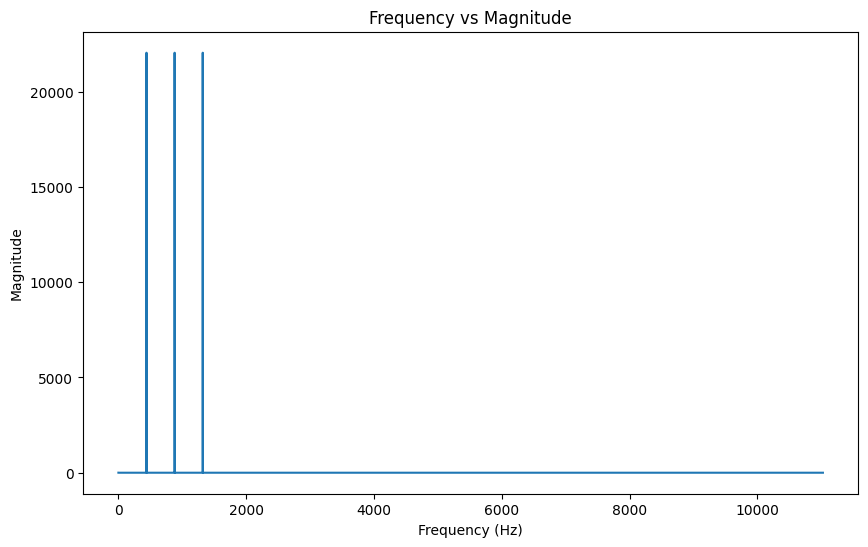

In [ ]:
audio_signal_dft = dft1(audio_signal)

N = len(audio_signal_dft)
freqs = np.arange(0, N // 2 + 1) * (sr / N)
neg_freqs = -np.flip(freqs[1:]) 
freqs = np.concatenate((freqs, neg_freqs))

magnitudes = np.abs(audio_signal_dft)

plt.figure(figsize=(10, 6))
plt.plot(freqs[:len(freqs)//2], magnitudes[:len(magnitudes)//2]) 
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency vs Magnitude')
plt.show()

#### 1.2

In [ ]:
def dft2(x):
    row_transformed = np.array([dft1(row) for row in x])
    col_transformed = np.array([dft1(col) for col in row_transformed.T]).T
    return col_transformed

#### 1.3

In [210]:
def fft1(x):
    N = x.shape[-1]
    if np.log2(N) % 1 > 0:
        N = 2 ** int(np.ceil(np.log2(N)))
        x = np.pad(x, (0, N - len(x)))
    if N <= 1:  
        return x
    else:
        x_even = fft1(x[::2])
        x_odd = fft1(x[1::2])

        factor = np.exp(-2j * np.pi * np.arange(N) / N)
        return np.concatenate([x_even + factor[:N // 2] * x_odd,
                               x_even - factor[:N // 2] * x_odd])

#### 1.4

In [209]:
def fft2(x):
    rows, cols = x.shape
    if np.log2(rows) % 1 > 0:
        rows = 2 ** int(np.ceil(np.log2(rows)))
        x = np.pad(x, ((0, rows - x.shape[0]), (0, 0)), mode='constant')
    if np.log2(cols) % 1 > 0:
        cols = 2 ** int(np.ceil(np.log2(cols)))
        x = np.pad(x, ((0, 0), (0, cols - x.shape[1])), mode='constant')

    row_transformed = np.array([fft1(row) for row in x])
    col_transformed = np.array([fft1(col) for col in row_transformed.T]).T

    return col_transformed 


In [217]:
def fftshift_2d(arr):
    rows, cols = arr.shape
    shifted_rows = np.concatenate([arr[rows//2:], arr[:rows//2]], axis=0)
    shifted_arr = np.concatenate([shifted_rows[:, cols//2:], shifted_rows[:, :cols//2]], axis=1)
    return shifted_arr

#### 1.5

  0%|          | 0/512 [00:00<?, ?it/s]

100%|██████████| 1024/1024 [00:00<00:00, 21793.79it/s]


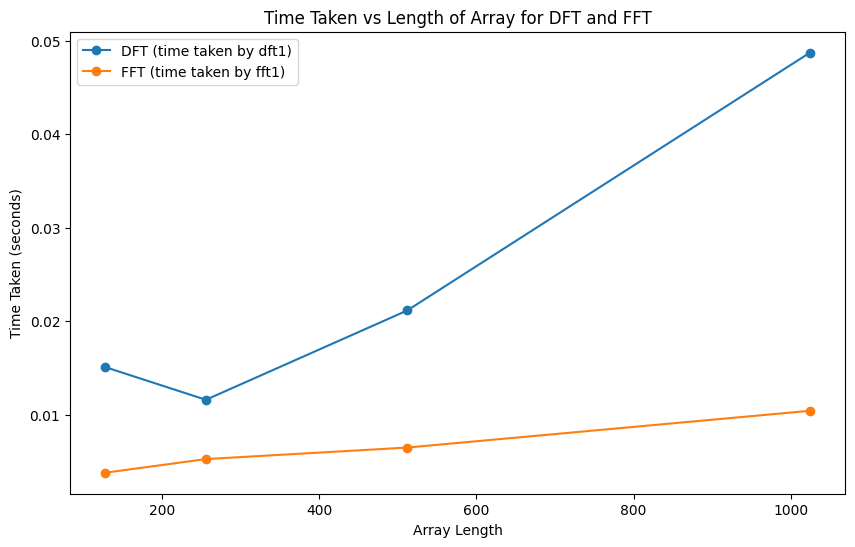

In [391]:
lengths = [128, 256, 512, 1024]
dft_times = []
fft_times = []

for length in lengths:
    x = np.random.random(length)

    start_time = time.time()
    dft1(x)
    dft_times.append(time.time() - start_time)
    
    start_time = time.time()
    fft1(x)
    fft_times.append(time.time() - start_time)

plt.figure(figsize=(10, 6))
plt.plot(lengths, dft_times, label='DFT (time taken by dft1)', marker='o')
plt.plot(lengths, fft_times, label='FFT (time taken by fft1)', marker='o')
plt.xlabel('Array Length')
plt.ylabel('Time Taken (seconds)')
plt.title('Time Taken vs Length of Array for DFT and FFT')
plt.legend()
plt.show()

#### 1.6

100%|██████████| 256/256 [00:00<00:00, 23073.36it/s]


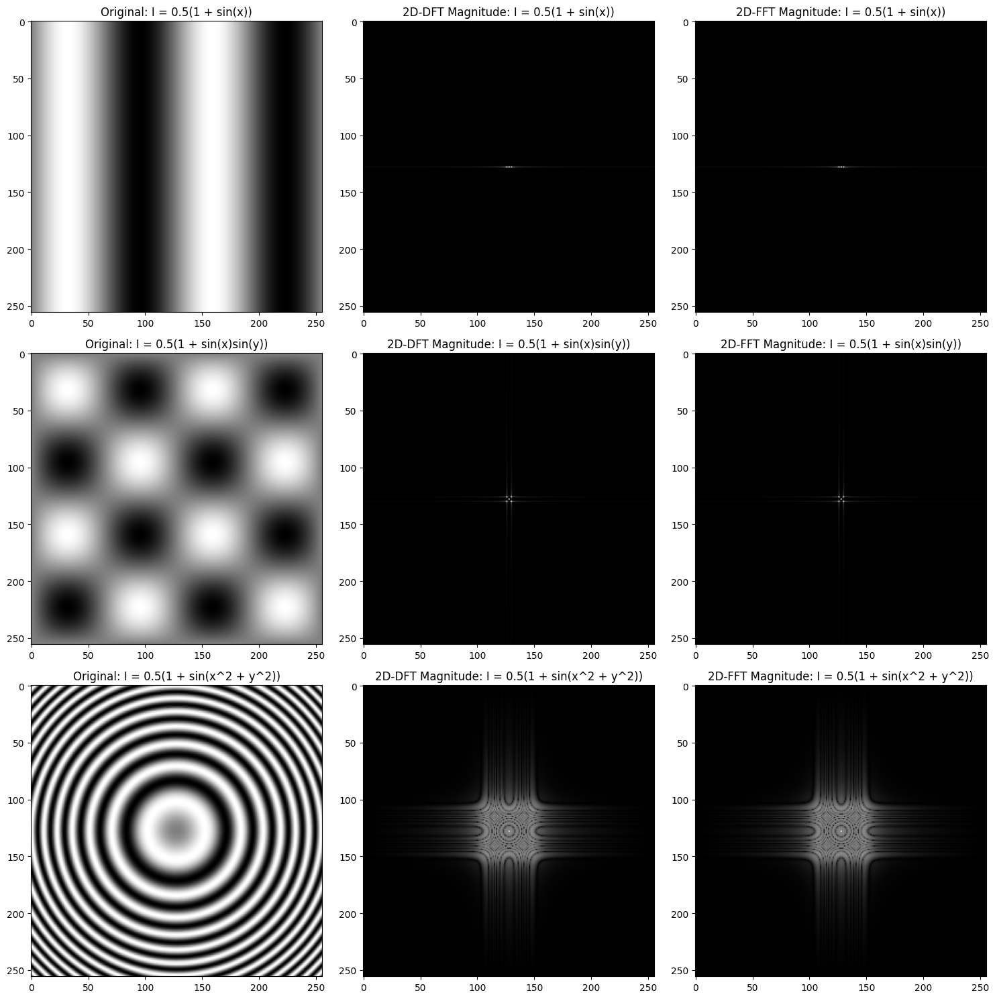

In [ ]:
size = 256
x = np.linspace(-2 * np.pi, 2 * np.pi, size)
y = np.linspace(-2 * np.pi, 2 * np.pi, size)
X, Y = np.meshgrid(x, y)

I1 = 0.5 * (1 + np.sin(X))
I2 = 0.5 * (1 + np.sin(X) * np.sin(Y))
I3 = 0.5 * (1 + np.sin(X**2 + Y**2))

signals = [I1, I2, I3]
titles = ['I = 0.5(1 + sin(x))', 'I = 0.5(1 + sin(x)sin(y))', 'I = 0.5(1 + sin(x^2 + y^2))']

plt.figure(figsize=(15, 15))
for i, I in enumerate(signals):

    dft_out = dft2(I)
    fft_out = fft2(I)
    
    plt.subplot(3, 3, i * 3 + 1)
    plt.imshow(I, cmap='gray')
    plt.title(f'Original: {titles[i]}')
    
    plt.subplot(3, 3, i * 3 + 2)
    plt.imshow(np.log(np.abs(fftshift_2d(dft_out)) + 10), cmap='gray')
    plt.title(f'2D-DFT Magnitude: {titles[i]}')
    
    plt.subplot(3, 3, i * 3 + 3)
    plt.imshow(np.log(np.abs(fftshift_2d(fft_out)) + 10), cmap='gray')
    plt.title(f'2D-FFT Magnitude: {titles[i]}')

plt.tight_layout()
plt.show()


#### 1.7

In [7]:
img1 = read_image('../images/img1.jpg')
img1_b, img1_g, img1_r = img1[:,:,0], img1[:,:,1], img1[:,:,2]
dft_img1_r = fft2(img1_r)
dft_img1_r_again = fft2(dft_img1_r)
dft_img1_g = fft2(img1_g)
dft_img1_g_again = fft2(dft_img1_g)
dft_img1_b = fft2(img1_b)
dft_img1_b_again = fft2(dft_img1_b)

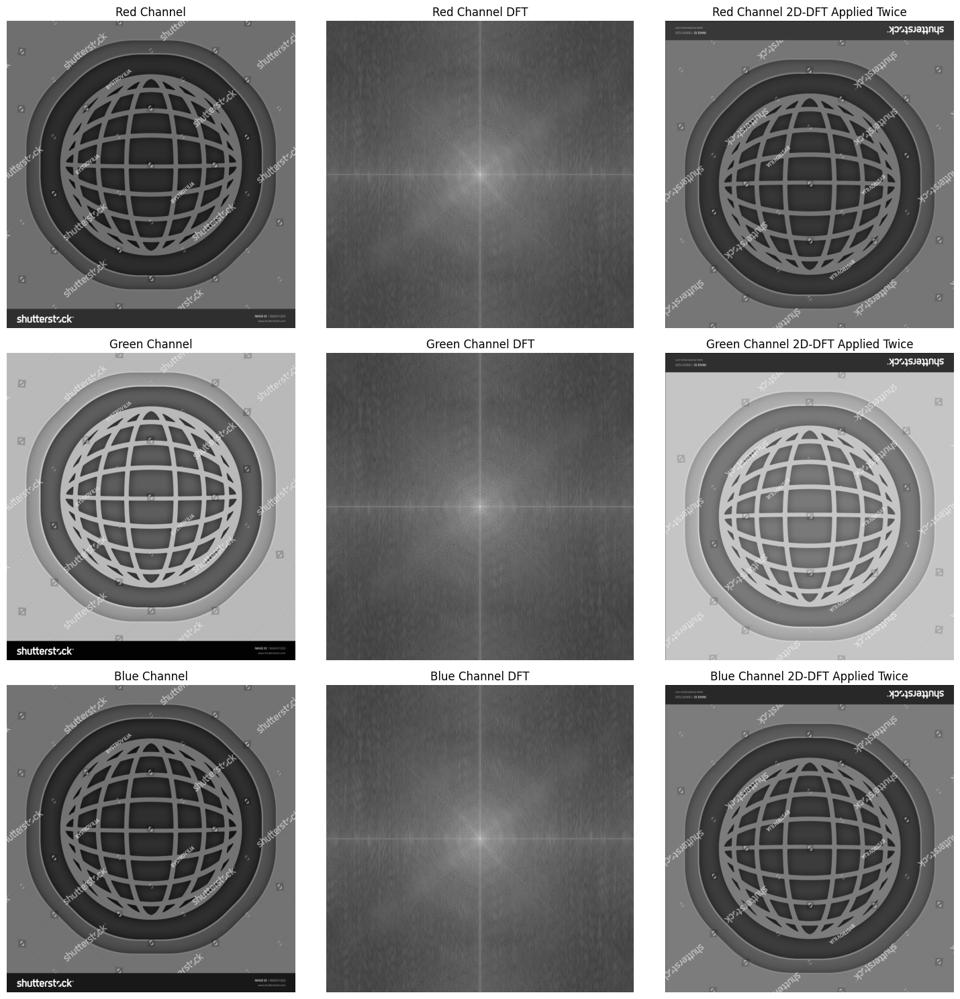

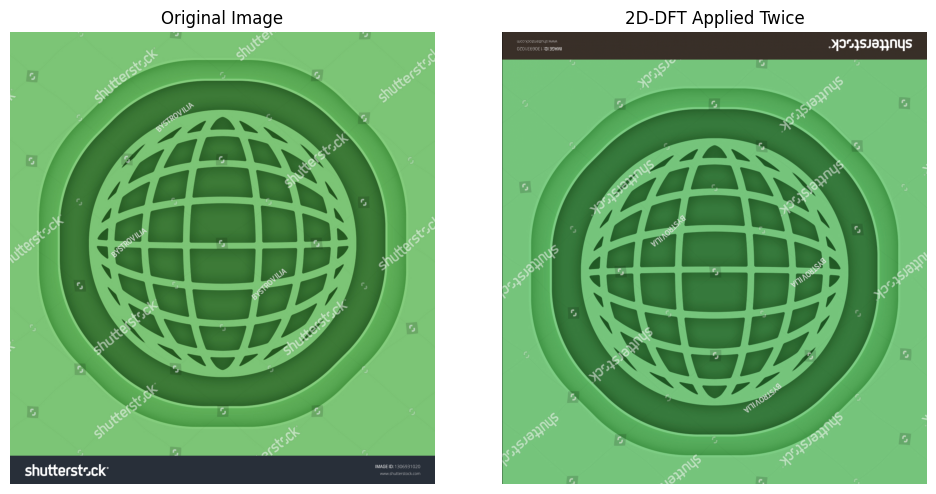

In [ ]:
plt.figure(figsize=(15, 15))

plt.subplot(3, 3, 1)
plt.axis('off')
plt.imshow(img1_r, cmap='gray')
plt.title('Red Channel')

plt.subplot(3, 3, 2)
plt.axis('off')
plt.imshow(np.log(10 + np.abs(fftshift_2d(dft_img1_r))), cmap='gray')
plt.title('Red Channel DFT')

plt.subplot(3, 3, 3)
plt.axis('off')
plt.imshow(np.abs(dft_img1_r_again)[-img1_r.shape[0]:,-img1_r.shape[1]:], cmap='gray')
plt.title('Red Channel 2D-DFT Applied Twice')

plt.subplot(3, 3, 4)
plt.axis('off')
plt.imshow(img1_g, cmap='gray')
plt.title('Green Channel')

plt.subplot(3, 3, 5)
plt.axis('off')
plt.imshow(np.log(10 + np.abs(fftshift_2d(dft_img1_g))), cmap='gray')
plt.title('Green Channel DFT')

plt.subplot(3, 3,6)
plt.axis('off')
plt.imshow(np.abs(dft_img1_g_again)[-img1_r.shape[0]:,-img1_r.shape[1]:], cmap='gray')
plt.title('Green Channel 2D-DFT Applied Twice')

plt.subplot(3, 3, 7)
plt.axis('off')
plt.imshow(img1_b, cmap='gray')
plt.title('Blue Channel')

plt.subplot(3, 3, 8)
plt.axis('off')
plt.imshow(np.log(10 + np.abs(fftshift_2d(dft_img1_b))), cmap='gray')
plt.title('Blue Channel DFT')

plt.subplot(3, 3, 9)
plt.axis('off')
plt.imshow(np.abs(dft_img1_b_again)[-img1_r.shape[0]:,-img1_r.shape[1]:], cmap='gray')
plt.title('Blue Channel 2D-DFT Applied Twice')

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))

reconstruted_img = np.stack((dft_img1_r_again, 
                             dft_img1_g_again,
                             dft_img1_b_again), 
                             axis=-1)

reconstruted_img = np.abs(reconstruted_img)[-img1_r.shape[0]:,-img1_r.shape[1]:,:]

for i in range(3):
    reconstruted_img[:,:,i] = reconstruted_img[:,:,i] / np.max(reconstruted_img[:,:,i])

plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(img1)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(reconstruted_img, cmap='gray')
plt.title('2D-DFT Applied Twice')

plt.tight_layout()
plt.show()

**Observation**:
- As we can see that applying 2D-dft on a given image gives us frequeny domain representation(fourier transform).But applying 2d-dft again on output we received in previous part gives us the orginal image inverted by 180 degree. This is because idft(inverse of dft) is same as dft except that there is no negative sign in expontential term. 

### Question 2

In [9]:
def ifft1(x, size):
    x = x.conj()
    x = fft1(x)
    x = x.conj()
    x = x / x.size
    x = x[:size]

    return x

In [16]:
def ifft2(x, shape):
    x = x.conj()
    x = fft2(x)
    x = x.conj()
    x = x / x.size

    x = x[:shape[0], :shape[1]]
    return x

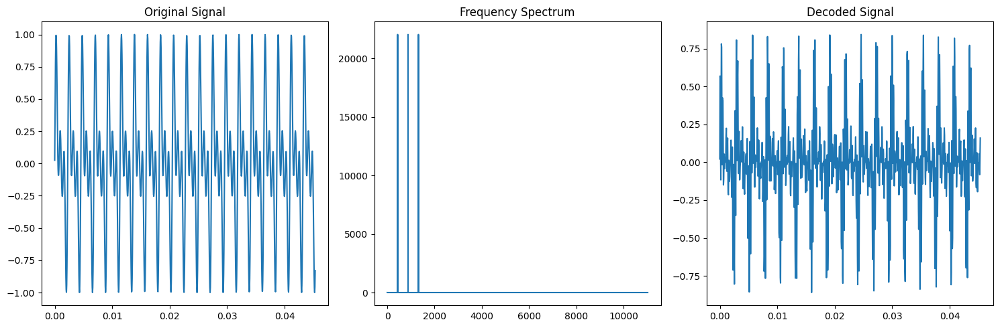

In [15]:

time = np.linspace(0, len(audio_signal) / sr, num=len(audio_signal))
decoded_signal = np.real(ifft1(audio_signal_dft, len(audio_signal)))

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(time[:1000], audio_signal[:1000]) 
plt.title("Original Signal")

plt.subplot(1, 3, 2)        
plt.plot(freqs[:len(freqs)//2], magnitudes[:len(magnitudes)//2]) 
plt.title("Frequency Spectrum")

plt.subplot(1, 3, 3)
plt.plot(time[:1000], decoded_signal[:1000])
plt.title("Decoded Signal")

plt.tight_layout()
plt.show()

In [17]:
img1_r_reconstructed = ifft2(dft_img1_r, img1_r.shape)
img1_g_reconstructed = ifft2(dft_img1_g, img1_g.shape)
img1_b_reconstructed = ifft2(dft_img1_b, img1_b.shape)

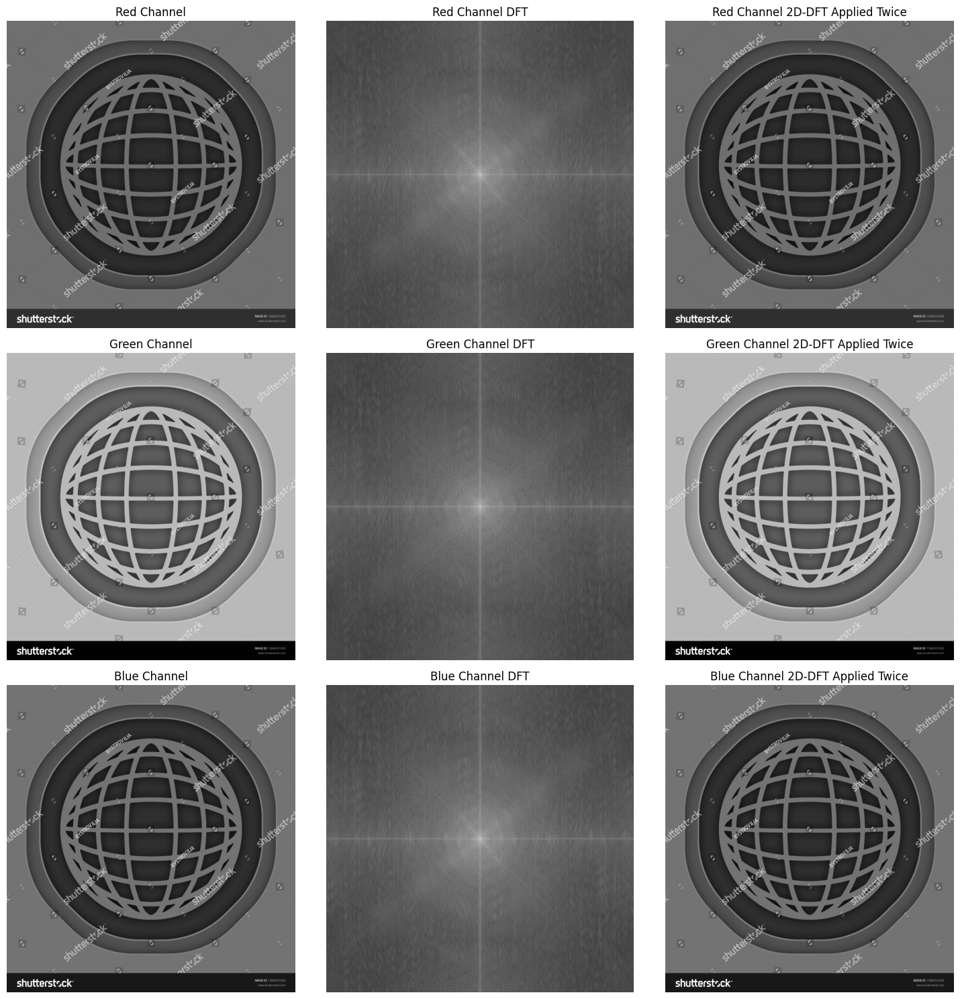

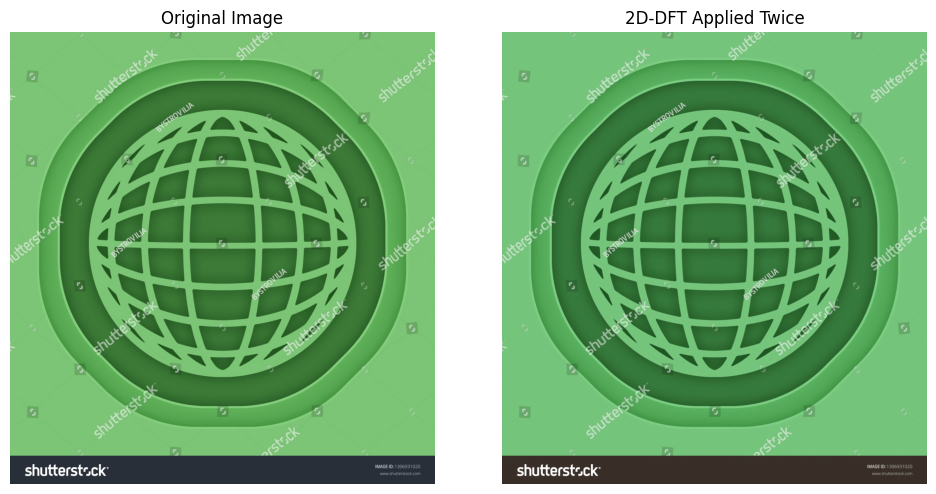

In [ ]:
plt.figure(figsize=(15, 15))

plt.subplot(3, 3, 1)
plt.axis('off')
plt.imshow(img1_r, cmap='gray')
plt.title('Red Channel')

plt.subplot(3, 3, 2)
plt.axis('off')
plt.imshow(np.log(10 + np.abs(fftshift_2d(dft_img1_r))), cmap='gray')
plt.title('Red Channel DFT')

plt.subplot(3, 3, 3)
plt.axis('off')
plt.imshow(np.abs(img1_r_reconstructed)[-img1_r.shape[0]:,-img1_r.shape[1]:], cmap='gray')
plt.title('Red Channel 2D-DFT Applied Twice')

plt.subplot(3, 3, 4)
plt.axis('off')
plt.imshow(img1_g, cmap='gray')
plt.title('Green Channel')

plt.subplot(3, 3, 5)
plt.axis('off')
plt.imshow(np.log(10 + np.abs(fftshift_2d(dft_img1_g))), cmap='gray')
plt.title('Green Channel DFT')

plt.subplot(3, 3,6)
plt.axis('off')
plt.imshow(np.abs(img1_g_reconstructed)[-img1_r.shape[0]:,-img1_r.shape[1]:], cmap='gray')
plt.title('Green Channel 2D-DFT Applied Twice')

plt.subplot(3, 3, 7)
plt.axis('off')
plt.imshow(img1_b, cmap='gray')
plt.title('Blue Channel')

plt.subplot(3, 3, 8)
plt.axis('off')
plt.imshow(np.log(10 + np.abs(fftshift_2d(dft_img1_b))), cmap='gray')
plt.title('Blue Channel DFT')

plt.subplot(3, 3, 9)
plt.axis('off')
plt.imshow(np.abs(img1_b_reconstructed)[-img1_r.shape[0]:,-img1_r.shape[1]:], cmap='gray')
plt.title('Blue Channel 2D-DFT Applied Twice')

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))

reconstruted_img = np.stack((img1_r_reconstructed, 
                             img1_g_reconstructed,
                             img1_b_reconstructed), 
                             axis=-1)

reconstruted_img = np.abs(reconstruted_img)[-img1_r.shape[0]:,-img1_r.shape[1]:,:]

for i in range(3):
    reconstruted_img[:,:,i] = reconstruted_img[:,:,i] / np.max(reconstruted_img[:,:,i])

plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(img1)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(reconstruted_img, cmap='gray')
plt.title('2D-DFT Applied Twice')

plt.tight_layout()
plt.show()

In [211]:
ein_image = cv2.imread('../images/ein.jpeg', cv2.IMREAD_GRAYSCALE)
freq_spectrum_ein = fft2(ein_image)

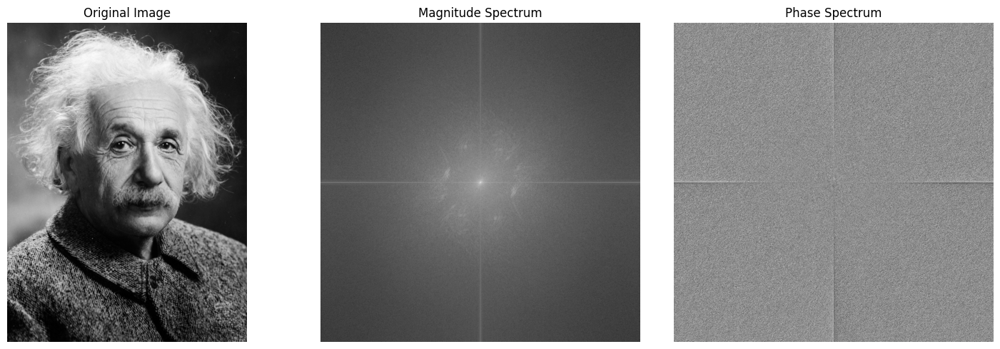

In [216]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(ein_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(np.log(10 + np.abs(fftshift_2d(freq_spectrum_ein))), cmap='gray')
plt.title("Magnitude Spectrum")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(np.log(10 + np.angle(fftshift_2d(freq_spectrum_ein))), cmap='gray')
plt.title("Phase Spectrum")
plt.axis('off')

plt.tight_layout()
plt.show()

In [21]:
phase = np.angle(freq_spectrum_ein)
rnd_phase = np.angle(np.exp(1j * 2 * np.pi * np.random.rand(*phase.shape)))
rnd_phase_combined = np.abs(freq_spectrum_ein) * np.exp(1j * rnd_phase)
reconstructed_ein_image = ifft2(rnd_phase_combined, ein_image.shape)

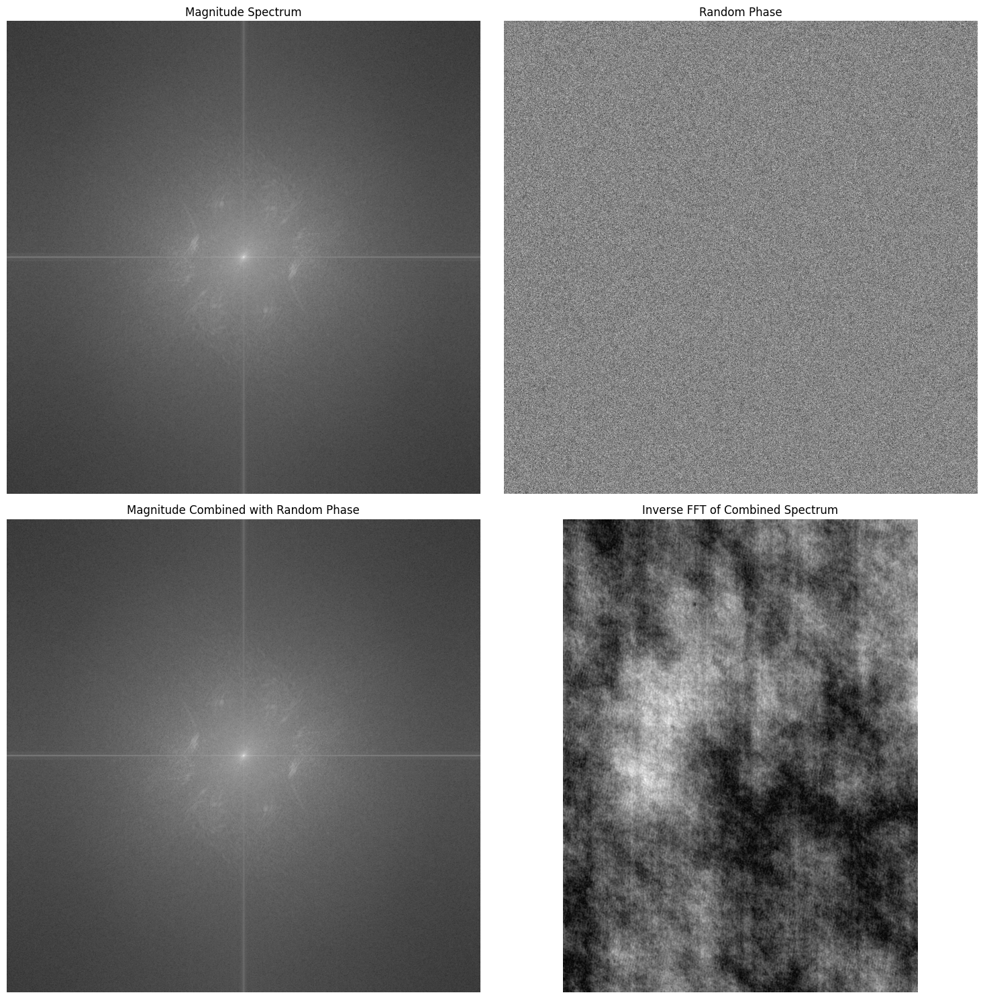

In [ ]:
# Plotting the results
plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1)
plt.imshow(np.log(10 + np.abs(fftshift_2d(freq_spectrum_ein))), cmap='gray')
plt.title("Magnitude Spectrum")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(10 + np.abs(fftshift_2d(rnd_phase))), cmap='gray')
plt.title("Random Phase")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(np.log(10 + np.abs(fftshift_2d(rnd_phase_combined))), cmap='gray')
plt.title("Magnitude Combined with Random Phase")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(reconstructed_ein_image), cmap='gray')
plt.title("Inverse FFT of Combined Spectrum")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
freq_spectrum_ein = fft2(ein_image)
magnitude = np.abs(fftshift_2d(freq_spectrum_ein))
shifted_phase = np.angle(fftshift_2d(freq_spectrum_ein))
constant_magnitude = np.mean(magnitude) * np.ones(magnitude.shape)
combined_spectrum = constant_magnitude * np.exp(1j * shifted_phase)
reconstructed_ein_image = ifft2(fftshift_2d(combined_spectrum), ein_image.shape)

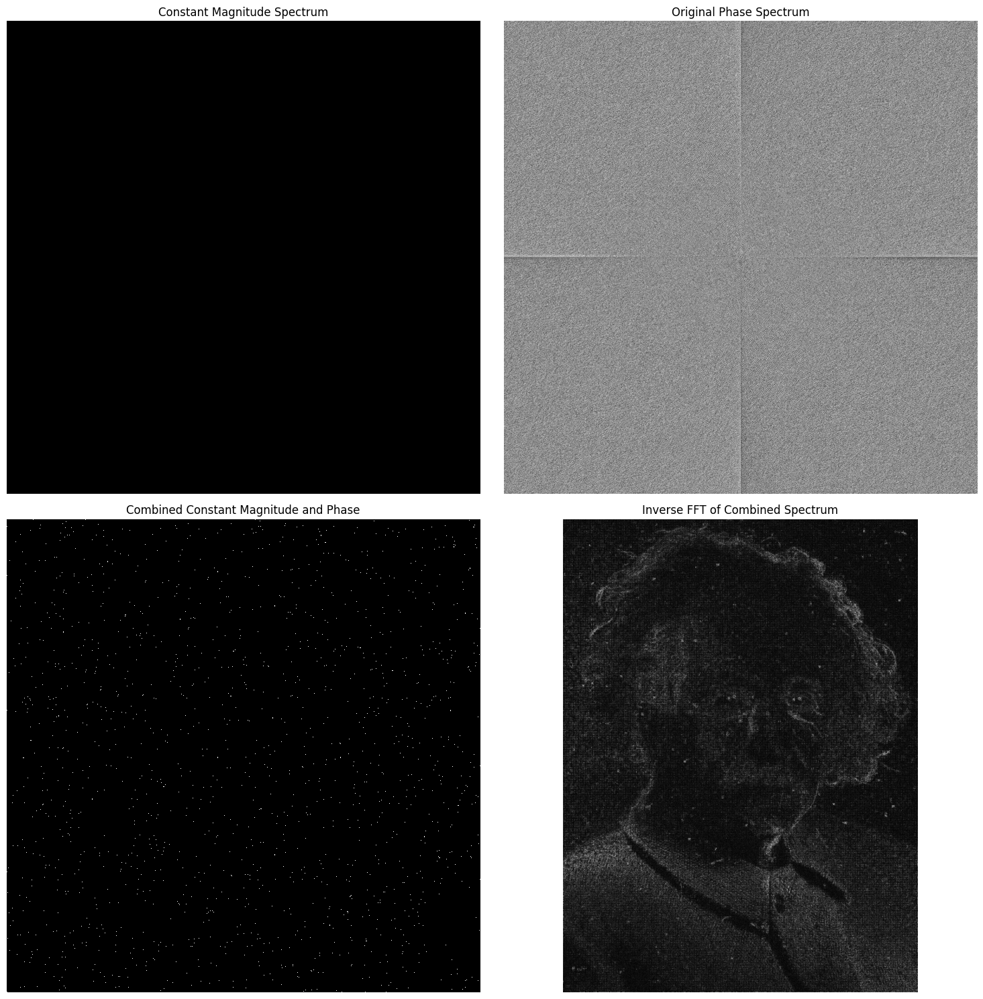

In [ ]:
# Plotting the results
plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1)
plt.imshow(np.log(10 + constant_magnitude), cmap='gray')
plt.title("Constant Magnitude Spectrum")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(10 + np.angle(fftshift_2d(freq_spectrum_ein))), cmap='gray')
plt.title("Original Phase Spectrum")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(np.log(10 + np.abs(fftshift_2d(combined_spectrum))), cmap='gray')
plt.title("Combined Constant Magnitude and Phase")
plt.axis('off')

plt.subplot(2, 2, 4)
enhanced_img = (np.abs(reconstructed_ein_image) * 5).astype(np.uint8)
plt.imshow(enhanced_img, cmap='gray', vmin=0, vmax=255)
plt.title("Inverse FFT of Combined Spectrum")
plt.axis('off')

plt.tight_layout() 
plt.show()

### Question 3

In [ ]:
fingerprint_image = cv2.imread('../images/fingerprint.png', cv2.IMREAD_GRAYSCALE)

In [140]:
def conv2D(img, kernel):
    if len(img.shape) == 3:
        img_height, img_width, num_channels = img.shape 
    else:
        img_height, img_width = img.shape  
        num_channels = 1  
        img = img[:, :, np.newaxis] 
    
    k = kernel.shape[0]
    outimg = np.zeros_like(img)
    pad_len = k // 2
    padded_img = np.pad(img, ((pad_len, pad_len), (pad_len, pad_len),(0, 0)), mode='edge')
    
    strided_img = as_strided(
        padded_img,
        shape=(img_height, img_width, k, k, num_channels),
        strides=(padded_img.strides[0], padded_img.strides[1], padded_img.strides[0], padded_img.strides[1], padded_img.strides[2])
    )
    if num_channels == 1:
        outimg = np.einsum('ijkl,kl->ij', strided_img[..., 0], kernel)
    else:
        outimg = np.einsum('ijklm,kl->ijm', strided_img, kernel)

    outimg = np.clip(outimg, 0, 255).astype(np.uint8)
    return outimg

def gaussKernel(k, sigma):
    ax = np.linspace(-(k // 2), k // 2, k)
    xx, yy = np.meshgrid(ax, ax)

    kernel = np.exp(-(np.square(xx) + np.square(yy)) / 2 * np.square(sigma))
    return kernel

def gaussFilter(img, k, sigma):
    kernel = gaussKernel(k=k, sigma=sigma)
    kernel /= np.sum(kernel)
    outimg = conv2D(img, kernel)   
    
    outimg = np.clip(outimg, 0, 255).astype(np.uint8)
    return outimg.astype(np.uint8)

In [ ]:
low_pass_filtered = gaussFilter(fingerprint_image, 41, 0)
high_pass_filtered = fingerprint_image.astype(np.float32) - low_pass_filtered.astype(np.float32)
high_pass_filtered = np.clip(high_pass_filtered, 0, 255).astype(np.uint8)
thresholded_img = binary_threshold(high_pass_filtered, 0)

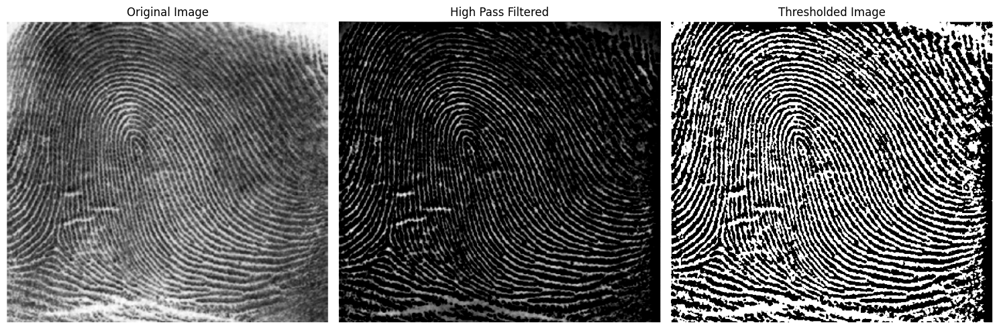

In [ ]:

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(fingerprint_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(high_pass_filtered, cmap='gray')
plt.title("High Pass Filtered")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(thresholded_img, cmap='gray')
plt.title("Thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()

**Steps:**
- Firstly I used guassian bluring to suppress high frequency components.Then subtracted this blurred output from original image to get high pass filtered image. 
- I used binary thresholding on high pass filtered output to get final Image.

### Question 4

In [ ]:
google_img = read_image('../images/google.jpeg', isGrayScale=False)

In [ ]:
def laplacianFilter(img, k):
    kernel = np.zeros((k, k))
  
    if k == 3:
        kernel = np.array([[0, -1, 0], 
                          [-1, 4, -1], 
                          [0, -1, 0]])
    elif k == 5:
        kernel = np.array([[0, 0, -1, 0, 0], 
                          [0, -1, -2, -1, 0], 
                          [-1, -2, 16, -2, -1], 
                          [0, -1, -2, -1, 0], 
                          [0, 0, -1, 0, 0]])
    elif k == 7:
        kernel = np.array([[0, 0, 0, -1, 0, 0, 0], 
                          [0, 0, -1, -2, -1, 0, 0], 
                          [0, -1, -2, -4, -2, -1, 0], 
                          [-1, -2, -4, 44, -4, -2, -1], 
                          [0, -1, -2, -4, -2, -1, 0], 
                          [0, 0, -1, -2, -1, 0, 0], 
                          [0, 0, 0, -1, 0, 0, 0]])

    outimg = conv2D(img, kernel)
    outimg = np.clip(outimg, 0, 255).astype(np.uint8)
    
    return outimg

def unsharpMask(img, k, sigma):
    img = img.astype(np.float16)
    blurred_img = laplacianFilter(img, k=k)
    blurred_img = np.clip(blurred_img, 0, 255).astype(np.uint8)
    sharpened_img = img + blurred_img * sigma
    sharpened_img = np.clip(sharpened_img, 0, 255).astype(np.uint8)
    return sharpened_img


In [ ]:
google_img_r, google_img_g, google_img_b = google_img[:,:,0], google_img[:,:,1], google_img[:,:,2]

low_pass_filtered = gaussFilter(google_img, 5, 0)
sharpened_img = unsharpMask(low_pass_filtered, k=7, sigma=0.1)

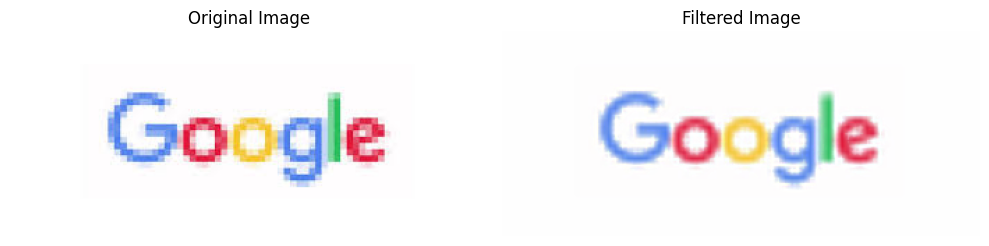

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(google_img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sharpened_img)
plt.title("Filtered Image")
plt.axis('off')

plt.tight_layout()
plt.show()

**Steps:**
- I used guassian bluring to suppress high frequency components.
- After this sharpened the image using unsharp masking.

### Question 5

In [ ]:
bird_img = cv2.imread('../images/bird.png', cv2.IMREAD_GRAYSCALE)
bird_img_fft = fft2(bird_img)

In [ ]:
dft = fft2(bird_img)
dft_shift = fftshift_2d(dft)

x, y = np.meshgrid(np.arange(-dft.shape[1]//2, dft.shape[1]//2), np.arange(-dft.shape[0]//2, dft.shape[0]//2))
dft_shift[(np.abs(x) >= 14) & (np.abs(x) <= 16) & (np.abs(y) <= 1)] = 0
dft_shift[(x >= 4) & (x <= 6) & (y >= 4) & (y <= 6)] = 0
dft_shift[(-x >= 4) & (-x <= 6) & (-y >= 4) & (-y <= 6)] = 0

f_ishift = fftshift_2d(dft_shift)
filtered_image = ifft2(f_ishift)
filtered_image = np.abs(filtered_image) 

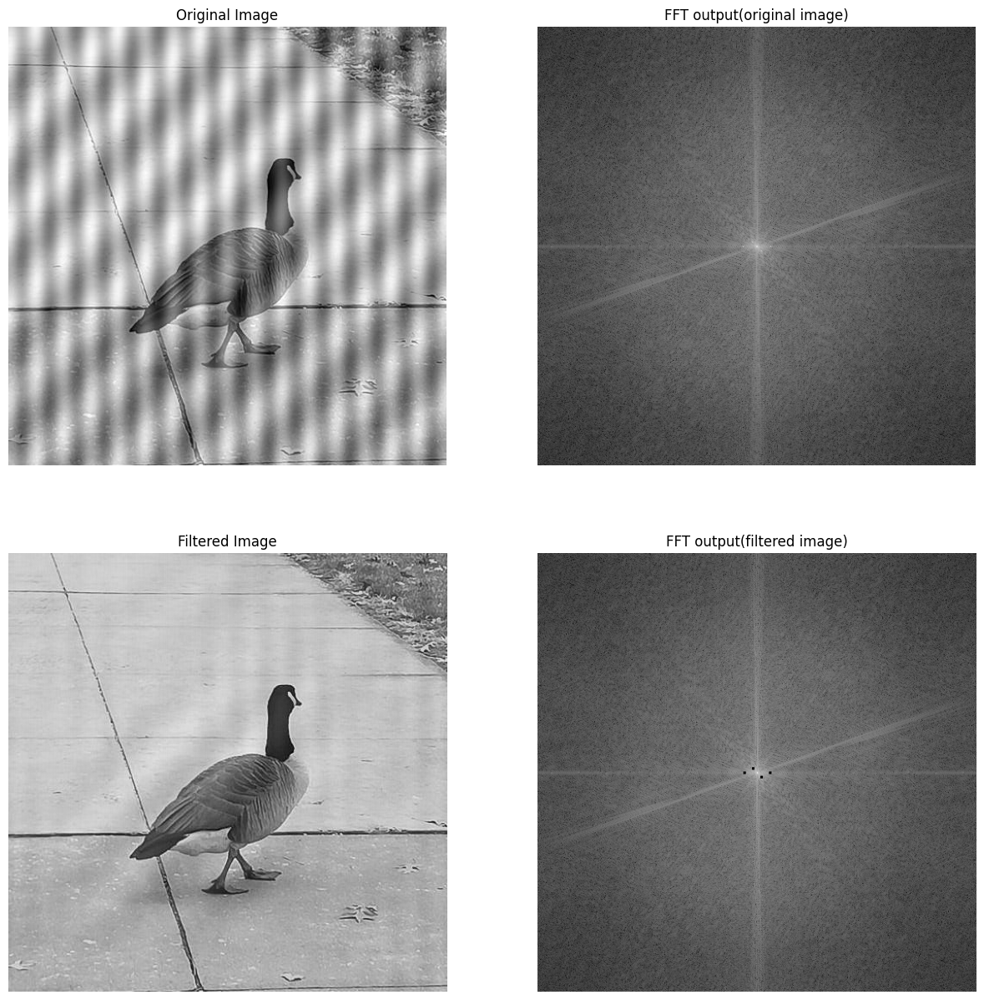

In [ ]:
plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
plt.imshow(bird_img, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(10 + np.abs(fftshift_2d(bird_img_fft))), cmap='gray')
plt.title("FFT output(original image)")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(filtered_image, cmap='gray')
plt.title("Filtered Image")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(np.log(10 + np.abs(dft_shift)), cmap='gray')
plt.title("FFT output(filtered image)")
plt.axis('off')

plt.show()

**Steps:**
- I computed the fourier transform of given image where we can see the noise frequencies.
- I suppressed these frequencies using a mask which I created by looking at the position of these frequencies in the spectrum.

In [ ]:
cart_img = read_image('../images/cart.jpg')
cart_img_r, cart_img_g, cart_img_b = cart_img[:,:,0], cart_img[:,:,1], cart_img[:,:,2]

In [ ]:
cart_img_r_dft = fft2(cart_img_r)
cart_img_g_dft = fft2(cart_img_g)
cart_img_b_dft = fft2(cart_img_b)

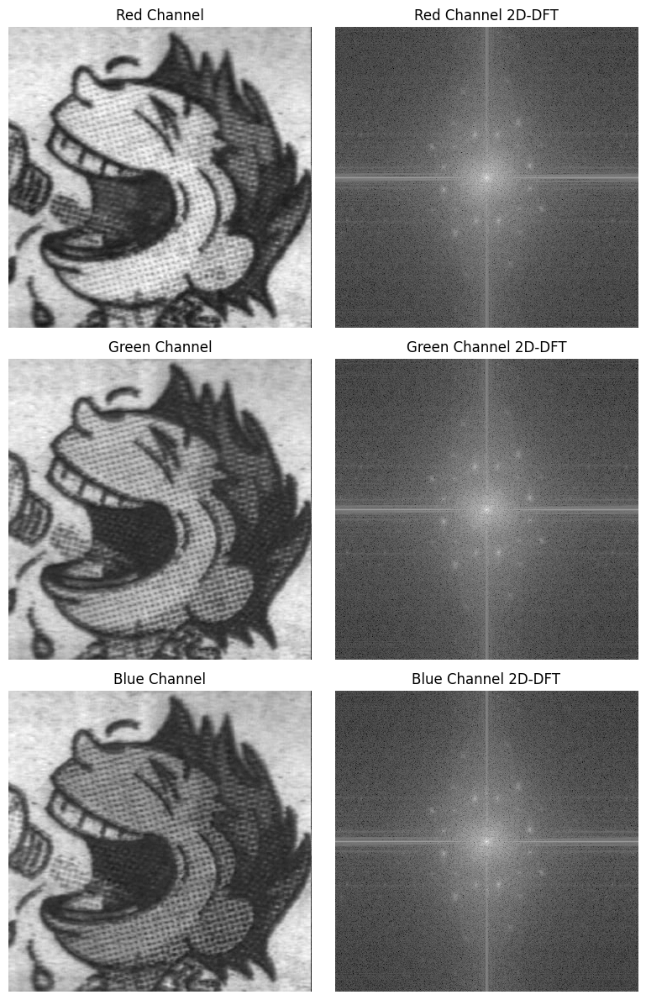

In [ ]:
plt.figure(figsize=(8, 12))

plt.subplot(3, 2, 1)
plt.imshow(cart_img_r, cmap='gray')
plt.title("Red Channel")
plt.axis('off')

plt.subplot(3, 2, 2)
plt.imshow(np.log(1 + np.abs(fftshift_2d(cart_img_r_dft))), cmap='gray')
plt.title("Red Channel 2D-DFT")
plt.axis('off')

plt.subplot(3, 2, 3)
plt.imshow(cart_img_g, cmap='gray')
plt.title("Green Channel")
plt.axis('off')

plt.subplot(3, 2, 4)
plt.imshow(np.log(1 + np.abs(fftshift_2d(cart_img_g_dft))), cmap='gray')
plt.title("Green Channel 2D-DFT")
plt.axis('off')

plt.subplot(3, 2, 5)
plt.imshow(cart_img_b, cmap='gray')
plt.title("Blue Channel")
plt.axis('off')

plt.subplot(3, 2, 6)
plt.imshow(np.log(1 + np.abs(fftshift_2d(cart_img_b_dft))), cmap='gray')
plt.title("Blue Channel 2D-DFT")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
def ideal_lpf(image, cut_off_frequency):
    fft = fft2(image)
    fft = fftshift_2d(fft)

    mask = np.zeros(fft.shape)
    x, y = np.meshgrid(np.arange(-fft.shape[1]//2, fft.shape[1]//2), np.arange(-fft.shape[0]//2, fft.shape[0]//2))
    dist = np.sqrt(x**2 + y**2)
    mask[dist <= cut_off_frequency] = 1

    filtered_fft = fft * mask
    filtered_image = np.abs(ifft2(filtered_fft, image.shape))
    
    return filtered_image, fftshift_2d(filtered_fft)

In [ ]:
filtered_r, filtered_r_dft = ideal_lpf(cart_img_r, 45)
filtered_g, filteged_g_dft = ideal_lpf(cart_img_g, 45)
filtered_b, filtered_b_dft = ideal_lpf(cart_img_b, 45)

reconstruted_img = np.stack((filtered_r, 
                             filtered_g,
                             filtered_b), 
                             axis=-1)

cart_img_lpf = np.abs(reconstruted_img)[-img1_r.shape[0]:,-img1_r.shape[1]:,:]

for i in range(3):
    cart_img_lpf[:,:,i] = cart_img_lpf[:,:,i] / np.max(cart_img_lpf[:,:,i])

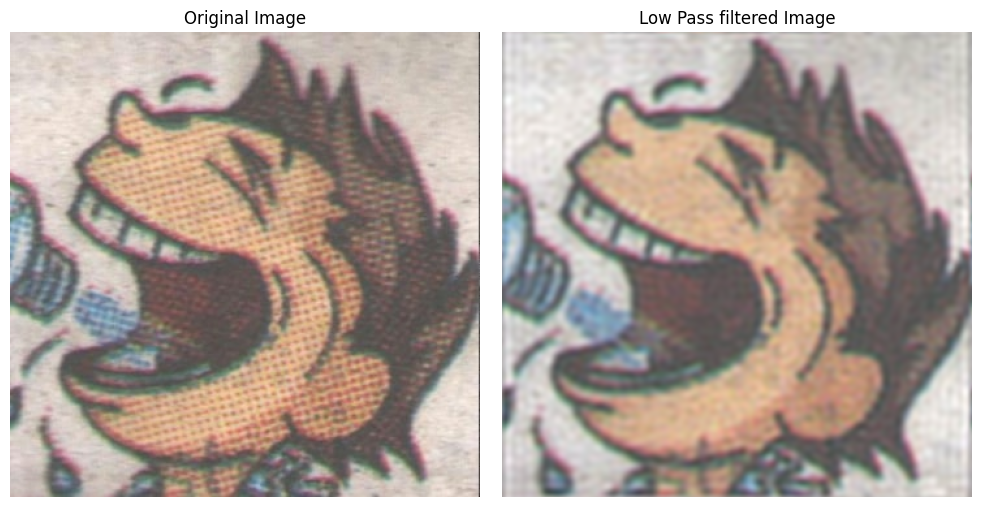

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cart_img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cart_img_lpf)
plt.title("Low Pass filtered Image")
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
def custom_notch_filter(image):
    image_dft = fft2(image)
    image_dft = fftshift_2d(image_dft)

    l = 11
    x, y = np.meshgrid(np.arange(-image_dft.shape[1]//2, image_dft.shape[1]//2), np.arange(-image_dft.shape[0]//2, image_dft.shape[0]//2))

    dist = np.sqrt(x ** 2 + y ** 2)
    mask = np.zeros(image_dft.shape)
    mask[(dist <= 45)] = 1
    dft_centered = mask * image_dft

    image_dft[(np.abs(x) > l) & (np.abs(y) > l)] = 0
    mask2 = (image_dft == 0)
    image_dft[mask2] = dft_centered[mask2]

    f_ishift = fftshift_2d(image_dft)
    filtered_image = np.abs(ifft2(f_ishift, image.shape))
    return filtered_image, f_ishift

In [ ]:
filtered_r, filtered_r_dft = custom_notch_filter(cart_img_r)
filtered_g, filteged_g_dft = custom_notch_filter(cart_img_g)
filtered_b, filtered_b_dft = custom_notch_filter(cart_img_b)

reconstruted_img = np.stack((filtered_r, 
                             filtered_g,
                             filtered_b), 
                             axis=-1)

cart_img_nf = np.abs(reconstruted_img)[-img1_r.shape[0]:,-img1_r.shape[1]:,:]

for i in range(3):
    cart_img_nf[:,:,i] = cart_img_nf[:,:,i] / np.max(cart_img_nf[:,:,i])

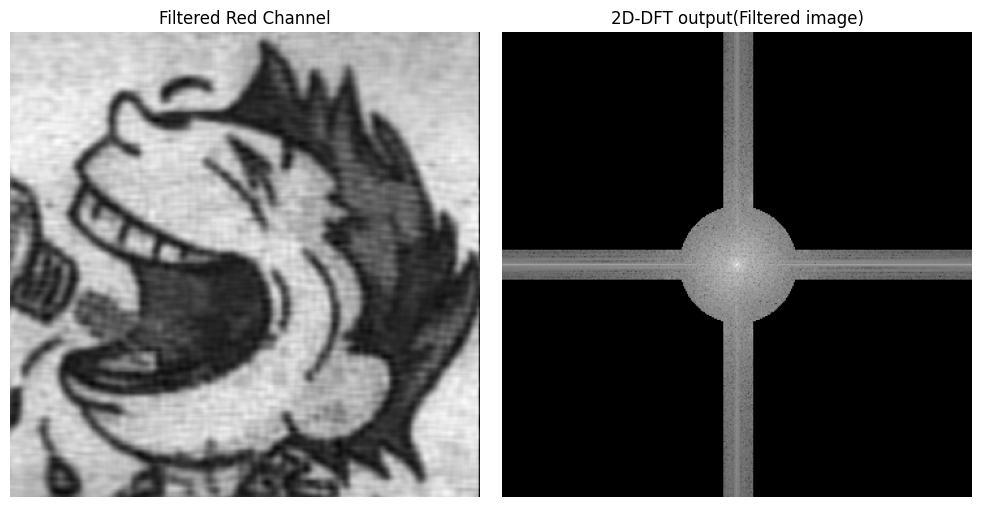

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(filtered_r, cmap='gray')
plt.title("Filtered Red Channel")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(np.log(1 + np.abs(fftshift_2d(filtered_r_dft))), cmap='gray')
plt.title("2D-DFT output(Filtered image)")
plt.axis('off')

plt.tight_layout()
plt.show()

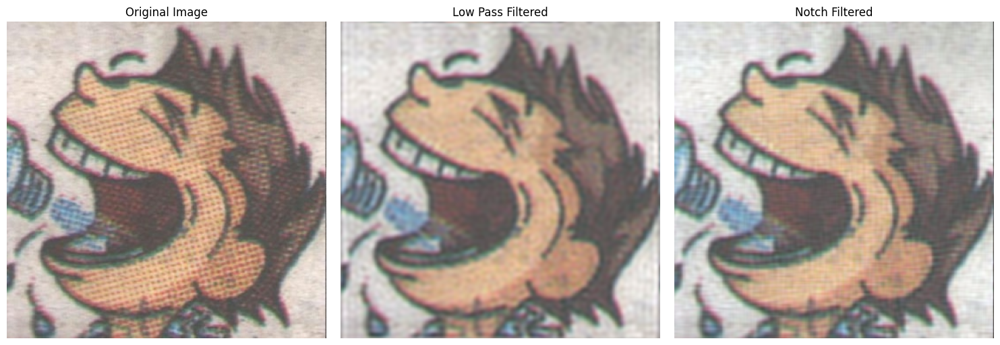

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cart_img, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cart_img_lpf, cmap='gray')
plt.title("Low Pass Filtered")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cart_img_nf, cmap='gray')
plt.title("Notch Filtered")
plt.axis('off')

plt.tight_layout()
plt.show()

**Steps:**
- I calculate the fourier transform of each channel of given image.From these spectrum we can identify the noise frequencies.
- In the first approach I used ideal low pass filter to remove these noise frequency. 
- In the second approach I used a notch filter to preserve some of the features as well with the low pass output.
- By comparing these two results, notch filtered output is better as it is more clearer than low pass filtered output.

### Question 6

In [46]:
def dfs(image, x, y):
    stack = [(x, y)]
    while stack:
        i, j = stack.pop()
        if i >= 0 and i < image.shape[0] and j >= 0 and j < image.shape[1] and image[i, j] == 255:
            image[i, j] = 0
            stack.append((i+1, j))  
            stack.append((i-1, j)) 
            stack.append((i, j+1))  
            stack.append((i, j-1)) 

def count_regions(image):
    region_count = 0
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if image[i, j] == 255:
                dfs(image, i, j)
                region_count += 1

    return region_count

In [ ]:
def circular_kernel(radius):
    diameter = 2 * radius + 1
    kernel = np.zeros((diameter, diameter), dtype=np.uint8)
    center = radius
    for i in range(diameter):
        for j in range(diameter):
            if np.sqrt((i - center) ** 2 + (j - center) ** 2) <= radius:
                kernel[i, j] = 1

    return kernel

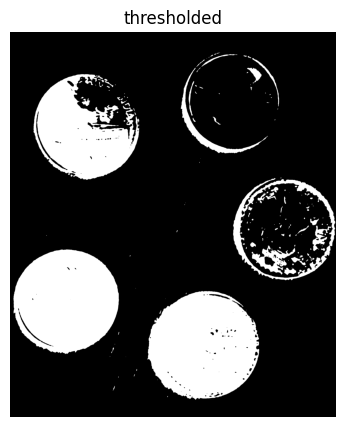

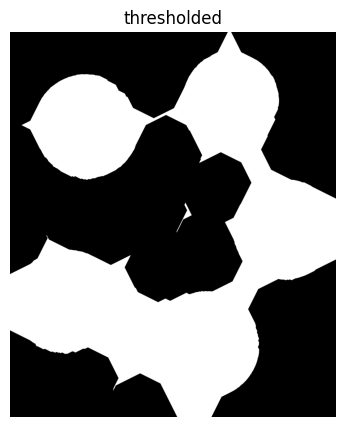

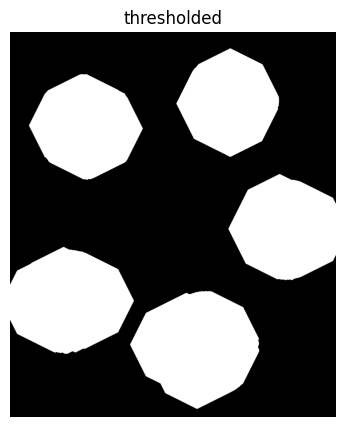

Number of coins: 5


In [ ]:
img = cv2.imread('../images/coin-detection.jpg', cv2.IMREAD_GRAYSCALE)
img = cv2.GaussianBlur(img, (21,21), 0)

thresholded = binary_threshold(img, threshold=100)
thresholded = (255 - thresholded).astype(np.uint8)
plot_image(thresholded, title='thresholded')

kernel = circular_kernel(3)

closed = cv2.morphologyEx(thresholded, cv2.MORPH_CLOSE, kernel, iterations=70)
plot_image(closed, title='thresholded')

opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=110)
plot_image(opened, title='thresholded')

coin_count = count_regions(opened.copy())
print(f"Number of coins: {coin_count}")


**Steps:**
- Firstly, I used guassian blurring followed by binary thresholding to separate the coin pixels from the background.
- I used morphological opening followed by morphological closing with circular kernel to cluster the coin pixels.
- Finally I used simple DFS approach to count number of coins.

### Question 7

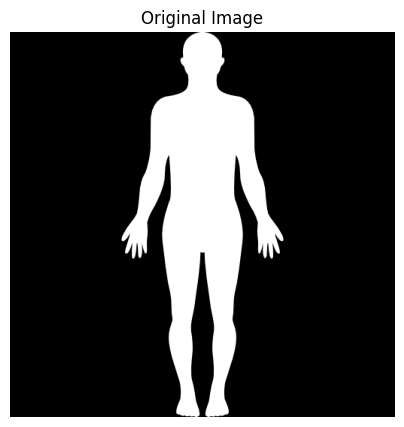

In [ ]:
human_img = cv2.imread('../images/human.png', cv2.IMREAD_UNCHANGED)
b, g, r, a = cv2.split(human_img)

img = a
plot_image(img, title='Original Image')

In [196]:
def skeletonize(image):
    skel = np.zeros(image.shape, np.uint8)
    element = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
    done = False

    while(not done):
        eroded = cv2.erode(image,element)
        temp = cv2.dilate(eroded,element)
        temp = cv2.subtract(image,temp)

        skel = cv2.bitwise_or(skel, temp)
        image = eroded.copy()

        if cv2.countNonZero(image) == 0:
            done = True
    return skel

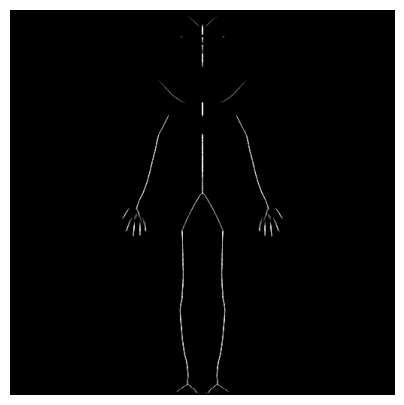

In [ ]:
img = a
skeleton = skeletonize(img)
plot_image(skeleton)

**Steps:**
- Here I used the algorithm discussed in the class to compute skeleton of given figure. 

### Question 8

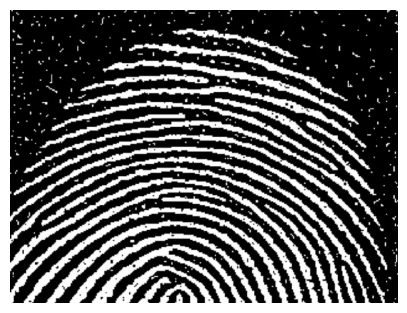

In [162]:
fingerprint2 = cv2.imread('../images/fingerprint2.png', cv2.IMREAD_GRAYSCALE)
plot_image(fingerprint2)

In [ ]:
def get_gabor_kernel(ksize, sigma, theta, lambd, gamma, psi):
    half_size = ksize // 2
    x = np.linspace(-half_size, half_size, ksize)
    y = np.linspace(-half_size, half_size, ksize)
    X, Y = np.meshgrid(x, y)
    
    X_prime = X * np.cos(theta) + Y * np.sin(theta)
    Y_prime = -X * np.sin(theta) + Y * np.cos(theta)

    exp_term = np.exp(-0.5 * (X_prime**2 + gamma**2 * Y_prime**2) / sigma**2)
    cosine_term = np.cos(2 * np.pi * X_prime / lambd + psi)
    
    gabor_kernel = exp_term * cosine_term
    return gabor_kernel.astype(np.float32)

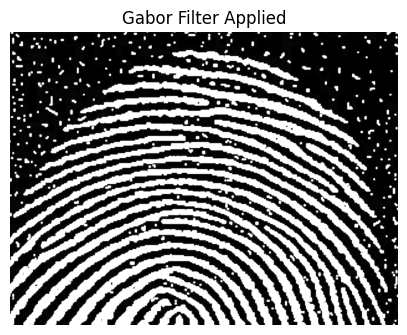

In [204]:
img = fingerprint2
ksize = 3  
sigma = 1.0  
lambd = 10.0  
gamma = 0.5
psi = 0  

theta_values = [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4]

filtered_images = []
for theta in theta_values:
    gabor_kernel = get_gabor_kernel(ksize, sigma, theta, lambd, gamma, psi)
    filtered_img = conv2D(img, gabor_kernel)
    filtered_images.append(filtered_img)

combined_img = np.clip(np.mean(filtered_images, axis=0), 0, 255).astype(np.uint8)

plot_image(combined_img, 'Gabor Filter Applied')

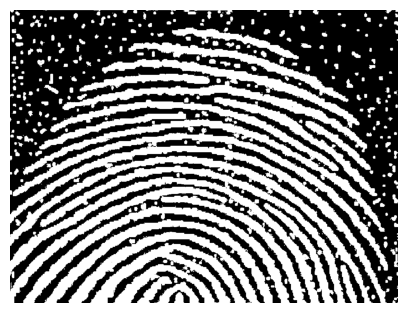

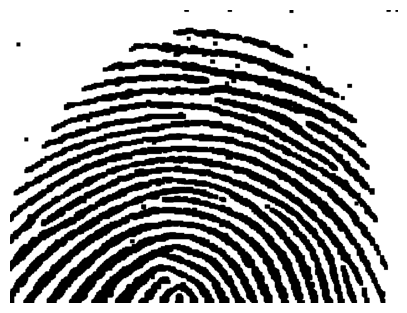

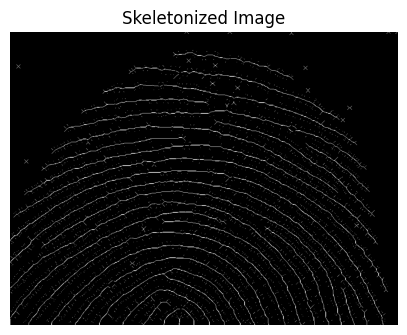

In [205]:
img = binary_threshold(combined_img, 15)
plot_image(img)
img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=5)
inverted = (255 - img).astype(np.uint8)
plot_image(inverted)

skeleton = skeletonize(img)
plot_image(skeleton, title='Skeletonized Image')

**Steps:**
- I used gabor filter in different orientations to enhanced the edges present in given image. 
- Then I used morphological opening to remove noise.
- Finally I computed the skeleton of given fingerprint to identify key edges.